In [54]:
# Imports
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import deque

%matplotlib inline

## Helper Functions

In [55]:
# --- Plotting ---
def plot_side_by_side(img_and_title_1, img_and_title_2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img_and_title_1[0])
    ax1.set_title(img_and_title_1[1], fontsize=50)
    ax2.imshow(img_and_title_2[0], cmap='gray')
    ax2.set_title(img_and_title_2[1], fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# --- Color transform and thresholding ---
def abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    # Apply threshold
    dx = 1 if orient == 'x' else 0
    dy = 1 - dx
    
    sobel = cv2.Sobel(gray, cv2.CV_64F, dx, dy)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return grad_binary

def mag_thresh(gray, sobel_kernel=3, thresh=(0, 255)):
    # Calculate gradient magnitude
    # Apply threshold
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1)

    mag = np.sqrt(sobel_x**2 + sobel_y**2)
    scaled_sobel = np.uint8(255*mag/np.max(mag))
    
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return mag_binary

def dir_thresh(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Apply threshold
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    abs_sobel_x = np.abs(sobel_x)
    abs_sobel_y = np.abs(sobel_y)

    dirs = np.arctan2(abs_sobel_y, abs_sobel_x)
    
    dir_binary = np.zeros_like(dirs)
    dir_binary[(dirs >= thresh[0]) & (dirs <= thresh[1])] = 1
    return dir_binary

def hls_threshold(hls, s_thresh=(0, 255), h_thresh=(0, 255)):
    # 1) Convert to HLS color space
    # 2) Apply a threshold to the S channel
    # 3) Return a binary image of threshold result
    h_channel = hls[:,:,0]
    s_channel = hls[:,:,2]
    hls_binary = np.zeros_like(s_channel)
    hls_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1]) & (h_channel >= h_thresh[0]) & (h_channel <= h_thresh[1])] = 1
    return hls_binary

## Distortion Correction

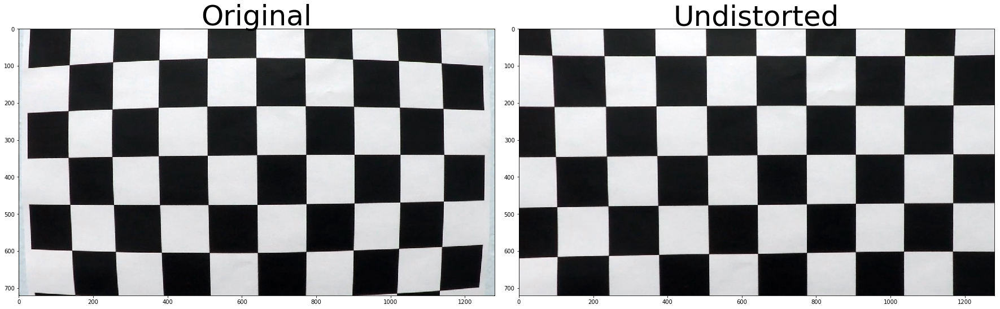

In [56]:
def distortion_correction(image_names):
    nx = 9
    ny = 6
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Step through the list and search for chessboard corners
    for fname in image_names:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        imgsize = gray.shape[::-1]

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    
    # Calibrate camera
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    return mtx, dist


chessboard_image_names = glob.glob('camera_cal/calibration*.jpg')
MTX, DIST = distortion_correction(chessboard_image_names)
# Pick an image and check the effect of calibration and undistortion
chessboard_sample = cv2.imread(chessboard_image_names[5])
chessboard_undist = cv2.undistort(chessboard_sample, MTX, DIST, None, MTX)

plot_side_by_side([chessboard_sample, 'Original'], [chessboard_undist, 'Undistorted'])

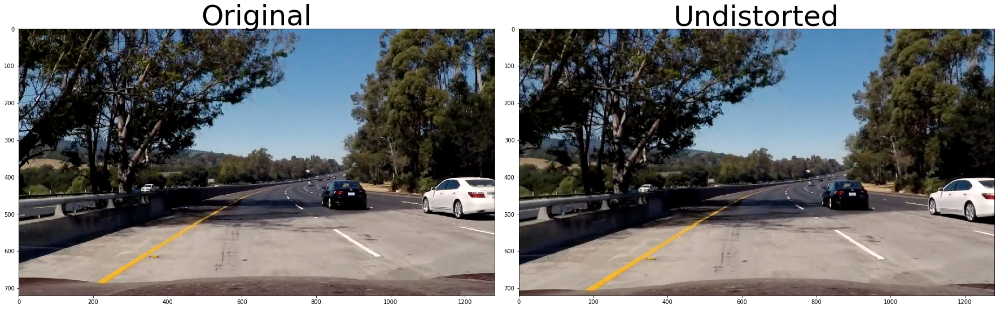

In [98]:
# Undistort a sample lane imange

lane_sample = mpimg.imread('test_images/test5.jpg')
lane_undist = cv2.undistort(lane_sample, MTX, DIST, None, MTX)
(HEIGHT, WIDTH, CHANNEL) = lane_undist.shape
MID_POINT = np.int(WIDTH//2)

plot_side_by_side([lane_sample, 'Original'], [lane_undist, 'Undistorted'])

# Color and Gradient Thresholding

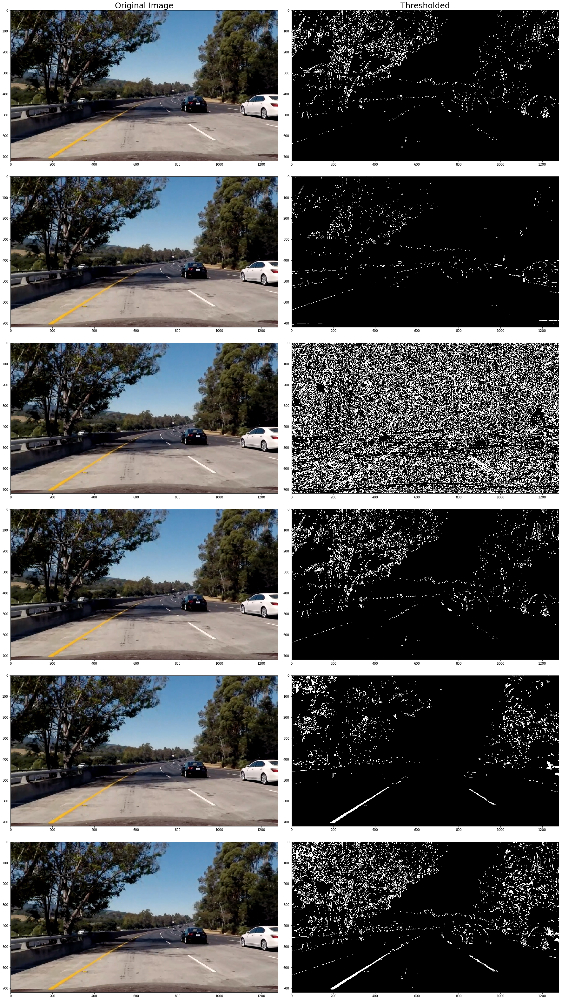

In [99]:
K_SIZE = 9 # Kernel size. Choose a larger odd number to smooth gradient measurements

def gradient_color_threshold(image, is_debug=False):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Apply Sobel filtering and thresholding
    gradx_binary = abs_sobel_thresh(gray, orient='x', sobel_kernel=K_SIZE, thresh=(35, 100))
    
    # Apply Magnitude filtering
    mag_binary = mag_thresh(gray, sobel_kernel=K_SIZE, thresh=(80, 130))
    
    # Apply Direction of Gradient filtering
    dir_binary = dir_thresh(gray, sobel_kernel=K_SIZE, thresh=(0.7, 1.3))
    
    # Combine gradient filters
    gradient_combined = np.zeros_like(gray)
#     gradient_combined[(gradx_binary == 1) & (dir_binary == 1)] = 1
    gradient_combined[(gradx_binary == 1) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    # HLS Color threshold
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    hls_binary = hls_threshold(hls, s_thresh=(170, 255), h_thresh=(10,100))
    
    # Combine gradient and color filtering
    final_binary = np.zeros_like(gray)
    final_binary[(gradient_combined == 1) | (hls_binary == 1)] = 1

    # Make some plots if in debug mode
    if is_debug:
        f, axes = plt.subplots(6, 2, figsize=(24, 48))
        f.tight_layout()
        axes[0,0].imshow(image)
        axes[0,0].set_title('Original Image', fontsize=25)
        axes[0,1].imshow(gradx_binary, cmap='gray')
        axes[0,1].set_title('Thresholded', fontsize=25)
        axes[1,0].imshow(image)
        axes[1,1].imshow(mag_binary, cmap='gray')
        axes[2,0].imshow(image)
        axes[2,1].imshow(dir_binary, cmap='gray')
        axes[3,0].imshow(image)
        axes[3,1].imshow(gradient_combined, cmap='gray')
        axes[4,0].imshow(image)
        axes[4,1].imshow(hls_binary, cmap='gray')
        axes[5,0].imshow(image)
        axes[5,1].imshow(final_binary, cmap='gray')
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        
    return final_binary

binary_thresholded = gradient_color_threshold(lane_undist, is_debug=True)

## Perspective Transform

In [59]:
SRC = np.float32(
    [[200, HEIGHT],
     [565, 470],
     [720, 470],
     [1125, HEIGHT]])
DST = np.float32(
    [[300, HEIGHT],
     [300, 210],
     [950, 210],
     [950, HEIGHT]])

M = cv2.getPerspectiveTransform(SRC, DST)
MINV = cv2.getPerspectiveTransform(DST, SRC)

def warp_image(image):
    return cv2.warpPerspective(image, M, (WIDTH, HEIGHT), flags=cv2.INTER_LINEAR)

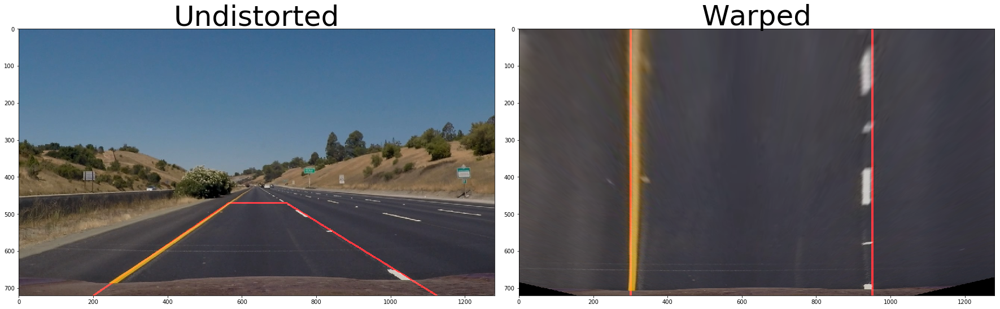

In [81]:
# Visualizing
persp = mpimg.imread('test_images/straight_lines1.jpg')
polygon = np.zeros_like(persp)
for i in range(SRC.shape[0]-1):
    p1 = tuple(SRC[i])
    p2 = tuple(SRC[i+1])
    cv2.line(polygon, p1, p2, (255, 0, 0), 4)
overlay = cv2.addWeighted(persp, 0.8, polygon, 1, 0.0)

persp_warped = warp_image(persp)
parallel_lines = np.zeros_like(persp_warped)
cv2.line(parallel_lines, (300, HEIGHT), (300, 0), (255, 0, 0), 4)
cv2.line(parallel_lines, (950, HEIGHT), (950, 0), (255, 0, 0), 4)
overlay_warped = cv2.addWeighted(persp_warped, 0.8, parallel_lines, 1, 0.0)

plot_side_by_side([overlay, 'Undistorted'], [overlay_warped, 'Warped'])

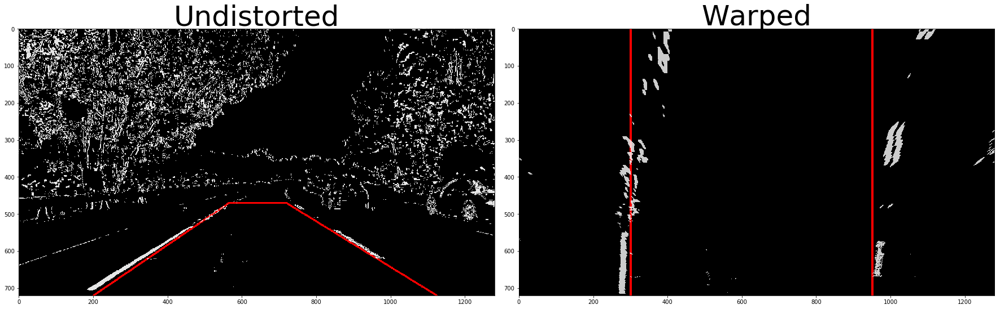

In [100]:
# Apply to thresholded binary image

stacked_combined = np.dstack((binary_thresholded, binary_thresholded, binary_thresholded))*255
binary_overlay = cv2.addWeighted(stacked_combined, 0.9, polygon, 1.0, 0.0)

binary_warped = warp_image(binary_thresholded)
stacked_binary = np.dstack((binary_warped, binary_warped, binary_warped))*255
binary_overlay_warped = cv2.addWeighted(stacked_binary, 0.8, parallel_lines, 1, 0.0)

plot_side_by_side([binary_overlay, 'Undistorted'], [binary_overlay_warped, 'Warped'])

## Lane Line Detection

In [113]:
from enum import Enum

# left_line.current_fit[:-1] = right_line.current_fit[:-1]
# left_line.current_fit[-1] = left_line.current_x_base - left_line.current_fit[0]*HEIGHT**2 - left_line.current_fit[1]*HEIGHT

# --- Fitting ---
PLOT_Y = np.linspace(0, HEIGHT-1, binary_warped.shape[0])
YM_PER_PIX = 30/720
XM_PER_PIX = 3.7/700

# Define a class to receive the characteristics of each line detection
class Line():
    # HYPERPARAMETERS
    failure_threshold = 5
    running_window = 10
    rect_margin = 100
    poly_margin = 100
    nwindows = 9
    minpix = 50
    last_current_poly_threshold = 0.5
    left_right_poly_threshold = 0.3
    dist_threshold = 750.0
    parallel_threshold = 50.0

    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False
        # counter for number of consecutive failures
        self.num_failures = 0
        # x values of the last n fits of the line
        self.recent_xfitted = deque([], Line.running_window)
        #average x values of the fitted line over the last n iterations
        self.bestx = None
        # x values of the last n fits of the line
        self.recent_fits = deque([], Line.running_window)
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None
        # The x value of the line pixels at the bottom of image
#         self.current_x_base = None
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
        #x values for detected line pixels
        self.allx = None
        #y values for detected line pixels
        self.ally = None
        self.debug_info = {}

    def search_from_scratch(self, binary_img, is_debug):
        print("search from scratch")
        # Take a histogram of the bottom half of the image
        bottom_height = np.int(HEIGHT//1.4)
        histogram = np.sum(binary_img[bottom_height:,:], axis=0)
        x_base = np.argmax(histogram)
#         self.current_x_base = x_base

        # Set height of windows - based on nwindows above and image shape
        window_height = np.int(HEIGHT//Line.nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        # Current positions to be updated later for each window in nwindows
        x_current = x_base
        lane_inds = []
        rect_coords = []

        # Step through the windows one by one
        for window in range(Line.nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = HEIGHT - (window+1)*window_height
            win_y_high = HEIGHT - window*window_height
            win_x_low = x_current - Line.rect_margin
            win_x_high = x_current + Line.rect_margin

            # Keep track of window coordinates for visualization
            if is_debug:
                rect_coords.append((win_x_low,win_y_low, win_x_high,win_y_high))

            # Identify the nonzero pixels in x and y within the window #
            good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                         (nonzerox >= win_x_low) &  (nonzerox < win_x_high)).nonzero()[0]

            # Append these indices to the lists
            lane_inds.append(good_inds)

            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_inds) > Line.minpix:
                x_current = np.int(np.mean(nonzerox[good_inds]))

        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        lane_inds = np.concatenate(lane_inds)
        # Extract left and right line pixel positions
        self.allx = nonzerox[lane_inds]
        self.ally = nonzeroy[lane_inds]
        
        # Fit polynomial
        self.fit_poly()

        # Keep track of debug information
        self.debug_info['rect_coords'] = rect_coords

    def search_around_poly(self, binary_img):
        print("search around poly")
        
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        # Set the area of search based on activated x-values within the +/- margin of polynomial
        x_centers = self.current_fit[0]*(nonzeroy**2) + self.current_fit[1]*nonzeroy + self.current_fit[2]
        lane_inds = ((nonzerox > (x_centers - Line.poly_margin)) & (nonzerox < (x_centers + Line.poly_margin)))
        
        # Extract left and right line pixel positions
        self.allx = nonzerox[lane_inds]
        self.ally = nonzeroy[lane_inds]
        
        # Fit polynomial
        self.fit_poly()
        
        # Update diffs in coefficient for the sanity check later
        self.diffs = np.abs(self.current_fit - self.best_fit)
        
    def fit_poly(self):
        self.current_fit = np.polyfit(self.ally, self.allx, 2)
        
    def check_current_fit(self):
        if self.detected:
            print("check current", np.sum(self.diffs))
            return np.sum(self.diffs) < Line.last_current_poly_threshold
        else:
            print("check current, detected=False")
            return True
    
    def success_update(self):
        print("success update")
        self.detected=True
        self.num_failures=0
        # Add fitted_x to recent_xfitted, update bestx, best_fit, ROC, line_base_pos
        self.recent_xfitted.append(self.generate_x_fitted())
        self.recent_fits.append(self.current_fit)
        self.bestx = np.average(self.recent_xfitted, axis=0)
        self.best_fit = np.average(self.recent_fits, axis=0)
        
        self.radius_of_curvature = self.measure_curvature()
        self.line_base_pos = self.compute_position()

    def failure_update(self):
        print("failure update")
        self.num_failures+=1
        if self.num_failures > Line.failure_threshold:
            detected=False
    
    def generate_x_fitted(self):
        return self.current_fit[0]*PLOT_Y**2 + self.current_fit[1]*PLOT_Y + self.current_fit[2]
    
    def current_x_fitted_at(self, y):
        return self.current_fit[0]*y**2 + self.current_fit[1]*y + self.current_fit[2]
    
    def current_curvature_at(self, y):
        return 2*self.current_fit[0]*y + self.current_fit[1]

    def measure_curvature(self):
        '''
        Calculates the curvature of polynomial functions in meters.
        '''
        return ((1 + (2*self.best_fit[0]*HEIGHT*YM_PER_PIX + self.best_fit[1])**2)**1.5) / np.absolute(2*self.best_fit[0])
    
    def compute_position(self):
        bottom_pos = self.best_fit[0]*HEIGHT**2 + self.best_fit[1]*HEIGHT + self.best_fit[2]
        return bottom_pos*XM_PER_PIX

    def process(self, binary_img, is_debug):
        if not self.detected:
            self.search_from_scratch(binary_img, is_debug)
        else:
            self.search_around_poly(binary_img)

    @staticmethod
    def sanity_check(left_line, right_line):
        # Each line compare with the previous fit
        # Compare across two lines: similar curvature, right distance, parallel
        # We reset two lines at the same time.
        if left_line.check_current_fit() and \
           right_line.check_current_fit() and \
           Line.check_across_lines(left_line, right_line):
            left_line.success_update()
            right_line.success_update()
        else:
            left_line.failure_update()
            right_line.failure_update()

    @staticmethod
    def check_across_lines(left_line, right_line):
        # Checking that they have similar curvature
        # Checking that they are separated by approximately the right distance horizontally
        # Checking that they are roughly parallel
        print("check across left fit: ", left_line.current_fit)
        print("check across right_fit: ", right_line.current_fit)
        left_curv = np.float32([left_line.current_curvature_at(y) for y in [0, HEIGHT]])
        right_curv = np.float32([right_line.current_curvature_at(y) for y in [0, HEIGHT]])
        
        left_xs = np.float32([left_line.current_x_fitted_at(y) for y in [0, HEIGHT]])
        right_xs = np.float32([right_line.current_x_fitted_at(y) for y in [0, HEIGHT]])
        dists = WIDTH//2 - left_xs + right_xs

        print("check across similar curv: ", np.sum(np.abs(left_curv-right_curv)))
        print("check across top bottom dists: ", dists, np.abs(dists[0] - dists[1]))

        return (np.sum(np.abs(left_curv-right_curv)) < Line.left_right_poly_threshold) and \
               (dists[1] < Line.dist_threshold) and \
               (np.abs(dists[0] - dists[1]) < Line.parallel_threshold)

* Check detected
    * If False: Lane detection from scratch.
        * Update allx, ally
    * If True: Lane detection from prior.
        * Update allx, ally, diffs
* Sanity check between current and previous and across two new polynomials
    * If detected is False, No need to compare with previous
    * If True:
        * Set detected to True
        * Set failure counter to 0
        * Add fitted_x to xfitted, update bestx, best_fit, ROC, line_base_pos
    * If False:
        * Don't change detected
        * Increment the failure counter. If failure counter > threshold, set detected=False
        * Continue to next frame

* The caller needs:
    * bestx
    * radius_of_curvature
    * line_base_pos
    
* Initialize: Work
* Success: Work
* Failure: Work
* Reset: Work

search from scratch
search from scratch
check current, detected=False
check current, detected=False
check across left fit:  [  2.64084198e-04  -3.67369498e-01   4.06725647e+02]
check across right_fit:  [  2.35586285e-04  -3.51321857e-01   4.54757692e+02]
check across similar curv:  0.041037
check across top bottom dists:  [ 688.03204346  684.81304932] 3.21899
success update
success update


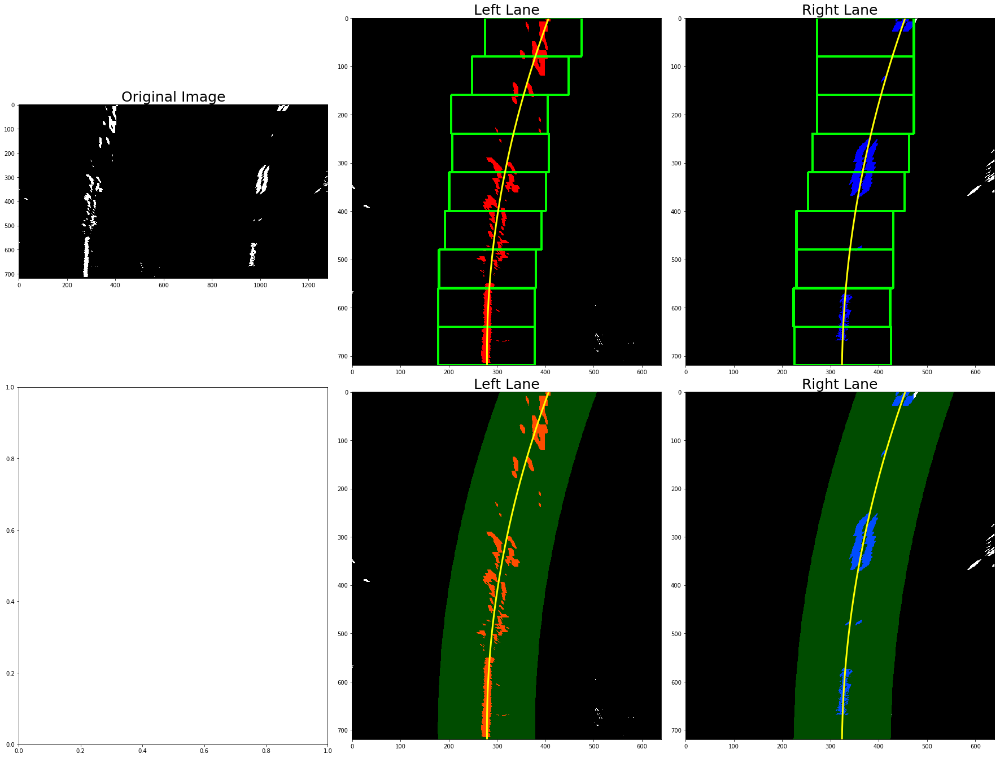

In [114]:
def plot_debug_image(a_plt, binary_img, a_line, color, title, plot_rect):
    xfitted = a_line.bestx
    debug_img = np.dstack((binary_img, binary_img, binary_img))*255
    debug_img[a_line.ally, a_line.allx] = color
    if plot_rect:
        for (win_x_low, win_y_low, win_x_high,win_y_high) in a_line.debug_info['rect_coords']:
            cv2.rectangle(debug_img,
                          (win_x_low,win_y_low),
                          (win_x_high,win_y_high),
                          (0, 255, 0), 3) 
    else:
        window_img = np.zeros_like(debug_img)
        line_window1 = np.array([np.transpose(np.vstack([xfitted-Line.poly_margin, PLOT_Y]))])
        line_window2 = np.array([np.flipud(np.transpose(np.vstack([xfitted+Line.poly_margin, PLOT_Y])))])
        line_pts = np.hstack((line_window1, line_window2))
        cv2.fillPoly(window_img, np.int_([line_pts]), (0,255, 0))
        debug_img = cv2.addWeighted(debug_img, 1, window_img, 0.3, 0)
    
    a_plt.set_title(title, fontsize=25)
    a_plt.imshow(debug_img)
    a_plt.plot(xfitted, PLOT_Y, color='yellow', linewidth=3)
    

def detect_lanes(binary, left_line, right_line, is_debug=False):
    # Split at mid point
    left_binary = binary[:, :MID_POINT]
    right_binary = binary[:, MID_POINT:]
    
    left_line.process(left_binary, is_debug)
    right_line.process(right_binary, is_debug)
    Line.sanity_check(left_line, right_line)

    if is_debug:
        f, axes = plt.subplots(2, 3, figsize=(24, 20))
        f.tight_layout()
        axes[0][0].imshow(binary, cmap='gray')
        axes[0][0].set_title('Original Image', fontsize=25)
        plot_debug_image(axes[0][1], left_binary, left_line, (255, 0, 0), 'Left Lane', plot_rect=True)
        plot_debug_image(axes[0][2], right_binary, right_line, (0, 0, 255), 'Right Lane', plot_rect=True)
        plot_debug_image(axes[1][1], left_binary, left_line, (255, 0, 0), 'Left Lane', plot_rect=False)
        plot_debug_image(axes[1][2], right_binary, right_line, (0, 0, 255), 'Right Lane', plot_rect=False)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Test search line from scratch
left_line = Line()
right_line = Line()
detect_lanes(binary_warped, left_line, right_line, is_debug=True)

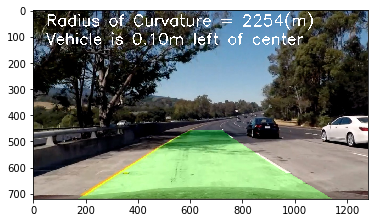

In [115]:
def generate_output(image, left_line, right_line):
    # Unwarp and draw lane
    # Create an image to draw the lines on
    warp_zero = np.zeros((HEIGHT, WIDTH)).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    left_fittedx = left_line.bestx
    right_fittedx = right_line.bestx + WIDTH // 2
    pts_left = np.array([np.transpose(np.vstack([left_fittedx, PLOT_Y]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fittedx, PLOT_Y])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, MINV, (WIDTH, HEIGHT)) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    
    # Add text
    rocs = np.float32([left_line.radius_of_curvature, right_line.radius_of_curvature])
    better_index = np.argmin(np.abs(rocs - 1000))
    better_roc = rocs[better_index]

    left_dist = left_line.line_base_pos
    right_dist = right_line.line_base_pos    
    offset_m = (left_dist + right_dist - XM_PER_PIX*(WIDTH//2)) / 2
    direction = 'left' if offset_m < 0 else 'right'
    direction_texts = [
        'Radius of Curvature = {:d}(m)'.format(np.int(better_roc)), 
        'Vehicle is {:.2f}m {} of center'.format(abs(offset_m), direction)]
    
    y0, dy = 60, 70
    for i, line in enumerate(direction_texts):
        y = y0 + i*dy
        cv2.putText(result, line, (50, y), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255), 3)
    return result

lane_result = generate_output(lane_undist, left_line, right_line)
plt.imshow(lane_result)

## Pipeline

search from scratch
search from scratch
check current, detected=False
check current, detected=False
check across left fit:  [  1.58244070e-04  -3.48946126e-01   4.92138291e+02]
check across right_fit:  [  2.24687756e-04  -3.72626753e-01   4.74540688e+02]
check across similar curv:  0.0956789
check across top bottom dists:  [ 622.40234375  639.79675293] 17.3944
success update
success update


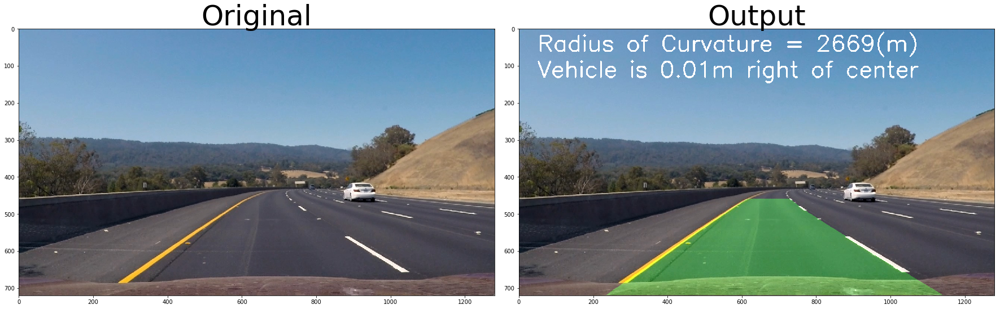

In [116]:
def process_image(image, left_line, right_line):
    undist = cv2.undistort(image, MTX, DIST, None, MTX)
    binary_thresholded = gradient_color_threshold(undist)
    binary_warped = warp_image(binary_thresholded)
    detect_lanes(binary_warped, left_line, right_line)
    return generate_output(image, left_line, right_line)

lane_sample_2 = mpimg.imread('test_images/test3.jpg')
lane_result_2 = process_image(lane_sample_2, Line(), Line())
plot_side_by_side([lane_sample_2, 'Original'], [lane_result_2, 'Output'])

## Process All Test Images

test_images/test1.jpg
search from scratch
search from scratch
check current, detected=False
check current, detected=False
check across left fit:  [  2.54733025e-04  -3.11796818e-01   4.24694933e+02]
check across right_fit:  [  1.86784524e-04  -3.07361586e-01   4.54267434e+02]
check across similar curv:  0.0978459
check across top bottom dists:  [ 669.57250977  637.54138184] 32.0311
success update
success update


test_images/test2.jpg
search from scratch
search from scratch
check current, detected=False
check current, detected=False
check across left fit:  [ -2.58653709e-04   3.58689969e-01   2.38601439e+02]
check across right_fit:  [ -2.42626003e-04   3.51855514e-01   2.25770553e+02]
check across similar curv:  0.0230799
check across top bottom dists:  [ 627.16912842  630.55706787] 3.38794
success update
success update


test_images/test3.jpg
search from scratch
search from scratch
check current, detected=False
check current, detected=False
check across left fit:  [  1.58244070e-04  -

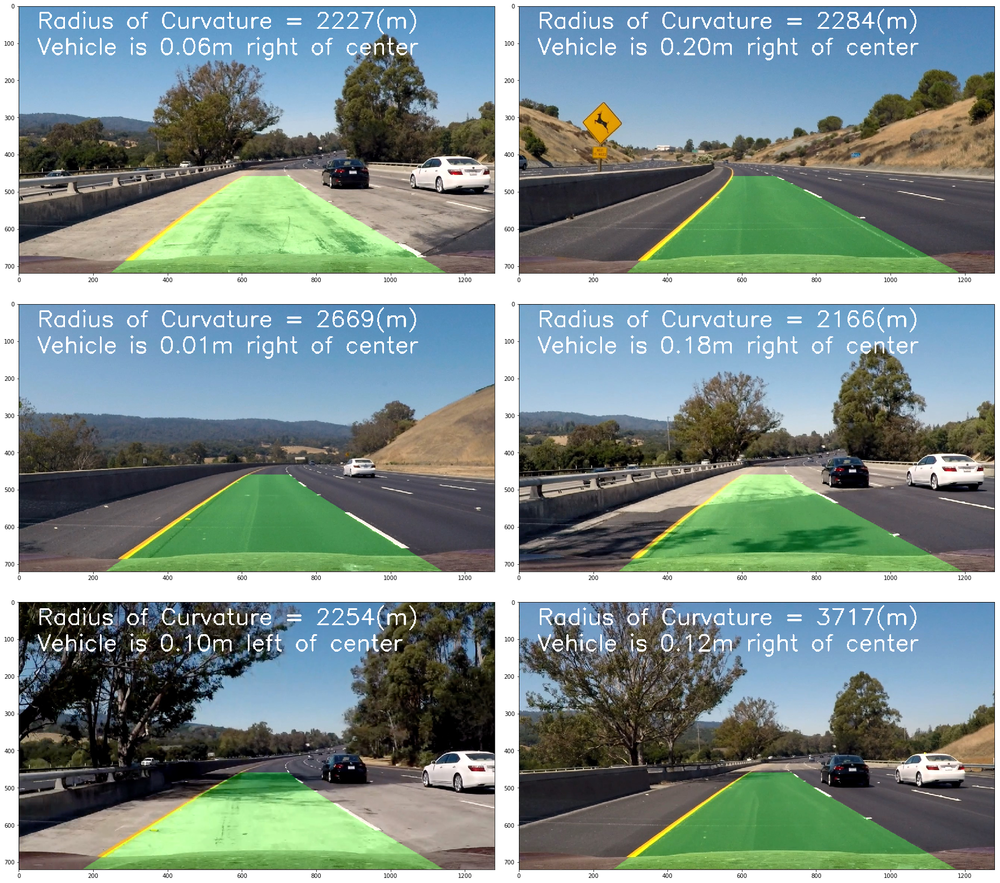

In [117]:
from functools import partial
test_images = sorted(glob.glob('test_images/test*.jpg'))

f, axes = plt.subplots(len(test_images)//2, 2, figsize=(24, 24))
f.tight_layout()
for i in range(len(test_images)):
    process_with_lines = partial(process_image, left_line=Line(), right_line=Line())
    fname = test_images[i]
    print(fname)
    processed = process_with_lines(mpimg.imread(fname))
    plt.imsave('output_images/' + fname.split('/')[1], processed)
    axes[i//2][i%2].imshow(processed)
    print('\n')
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Generate Videos